# Parte 1: Segmentación de Carreteras en Imágenes Aéreas de Alta Resolución: Desarrollo y Evaluación de un Método Computacional

Cargamos las imágenes

In [ ]:
import os
from skimage.io import imread
import matplotlib.pyplot as plt

# Directorios
base_path = r"C:\Users\enriq\OneDrive\Escritorio\CIENCIA E INGENIERÍA DE DATOS\TERCERO\2º CUATRI\PIVA\P2\Materiales\roads"
sat_path = os.path.join(base_path, "sat")
gt_path = os.path.join(base_path, "gt")

# Listar archivos .tif o .tiff
sat_files = sorted([f for f in os.listdir(sat_path) if f.endswith(".tif") or f.endswith(".tiff")])
gt_files = sorted([f for f in os.listdir(gt_path) if f.endswith(".tif") or f.endswith(".tiff")])

# Comprobar correspondencia entre archivos
assert len(sat_files) == len(gt_files), "Cantidad desigual de imágenes y máscaras"
for i in range(len(sat_files)):
    assert sat_files[i].split('.')[0] == gt_files[i].split('.')[0], f"No coinciden: {sat_files[i]} y {gt_files[i]}"

# Inicializar listas
imagenes = []
mascaras = []

# Cargar todas las imágenes y máscaras
for img_file, mask_file in tqdm(zip(sat_files, gt_files), total=len(sat_files), desc="Cargando imágenes"):
    img = imread(os.path.join(sat_path, img_file))
    mask = imread(os.path.join(gt_path, mask_file))
    
    assert img.shape[:2] == mask.shape[:2], f"Dimensiones diferentes: {img_file}"
    
    imagenes.append(img)
    mascaras.append(mask)

Extraemos y visualizamos características

In [10]:
import numpy as np
from skimage.color import rgb2hsv, rgb2lab
from skimage.filters import threshold_local
from scipy.ndimage import gaussian_gradient_magnitude

def extract_features(img):
    img = img.astype(np.float32) / 255.0  # Normalización

    # Espacios de color
    img_hsv = rgb2hsv(img)
    img_lab = rgb2lab(img)

    # Canales RGB y HSV
    r = img[:, :, 0].flatten()
    g = img[:, :, 1].flatten()
    b = img[:, :, 2].flatten()
    h = img_hsv[:, :, 0].flatten()
    s = img_hsv[:, :, 1].flatten()
    b_lab = img_lab[:, :, 2].flatten()

    # Binarizaciones directas
    h_bin = (img_hsv[:, :, 0] > 0.2).astype(np.uint8).flatten()
    s_bin = (img_hsv[:, :, 1] > 0.3).astype(np.uint8).flatten()
    b_bin = (img_lab[:, :, 2] > 20).astype(np.uint8).flatten()  # Ajuste porque Lab es distinto en skimage

    # Gradientes
    mag_h = gaussian_gradient_magnitude(img_hsv[:, :, 0], sigma=1).flatten()
    mag_s = gaussian_gradient_magnitude(img_hsv[:, :, 1], sigma=1).flatten()

    # Umbralización adaptativa usando skimage
    def adaptive_thresh(channel, block_size):
        local_thresh = threshold_local(channel, block_size, method='gaussian')
        return (channel > local_thresh).astype(np.uint8).flatten()

    adapt5 = adaptive_thresh(img[:, :, 0], 5)
    adapt15 = adaptive_thresh(img[:, :, 0], 15)
    adapt33 = adaptive_thresh(img[:, :, 0], 33)

    features = np.stack([
        r, g, b, h, s, b_lab,
        h_bin, s_bin, b_bin,
        mag_h, mag_s,
        adapt5, adapt15, adapt33
    ], axis=1)

    return features


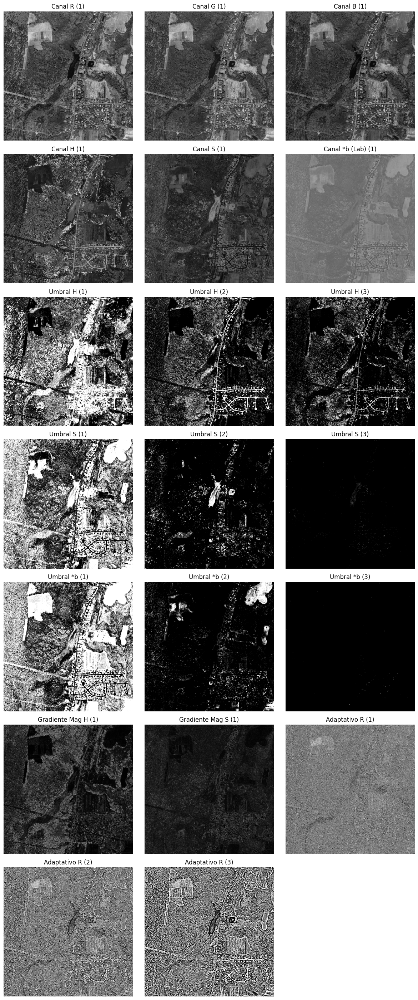

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_gradient_magnitude
from skimage.color import rgb2hsv, rgb2lab
from skimage.filters import threshold_local

# Imagen normalizada
img = imagenes[0].astype(np.float32) / 255.0
height, width, _ = img.shape

# Espacios de color
img_hsv = rgb2hsv(img)
img_lab = rgb2lab(img)

# Características base
r = img[:, :, 0]
g = img[:, :, 1]
b = img[:, :, 2]
h = img_hsv[:, :, 0]
s = img_hsv[:, :, 1]
b_lab = img_lab[:, :, 2]  # Puede tener valores negativos, pero seguimos con él como canal discriminativo

# Gradientes
mag_h = gaussian_gradient_magnitude(h, sigma=1)
mag_s = gaussian_gradient_magnitude(s, sigma=1)

# Umbralizaciones
umbral_h_vals = [0.2, 0.4, 0.6]
umbral_s_vals = [0.2, 0.4, 0.6]
umbral_b_vals = [5, 20, 40]  # Ajustados a valores típicos de Lab en skimage

# Adaptativos con skimage
def adaptive_threshold(channel, block_size):
    threshold = threshold_local(channel, block_size=block_size, method='gaussian')
    return (channel > threshold).astype(np.uint8)

adapt_sizes = [5, 15, 33]
adapt_thresh_r = [adaptive_threshold(r, bs) for bs in adapt_sizes]

# Panel de visualización
features_sets = [
    ("Canal R", [r]),
    ("Canal G", [g]),
    ("Canal B", [b]),
    ("Canal H", [h]),
    ("Canal S", [s]),
    ("Canal *b (Lab)", [b_lab]),
    ("Umbral H", [(h > t).astype(np.uint8) for t in umbral_h_vals]),
    ("Umbral S", [(s > t).astype(np.uint8) for t in umbral_s_vals]),
    ("Umbral *b", [(b_lab > t).astype(np.uint8) for t in umbral_b_vals]),
    ("Gradiente Mag H", [mag_h]),
    ("Gradiente Mag S", [mag_s]),
    ("Adaptativo R", adapt_thresh_r)
]

# Mostrar
cols = 3
rows = len(features_sets)
plt.figure(figsize=(cols * 4, rows * 4))

idx = 1
for name, variants in features_sets:
    for i, feat in enumerate(variants):
        plt.subplot(rows, cols, idx)
        plt.imshow(feat, cmap='gray')
        plt.title(f"{name} ({i+1})")
        plt.axis('off')
        idx += 1

plt.tight_layout()
plt.show()


Características seleccionadas:

Canales R, G, B y H: te dan información de color directa y de tono (H), útil porque la carretera tiene una coloración bastante uniforme.

*Canal b del Lab: separa bien zonas con diferente componente azul-amarillo, y resulta discriminativo en asfalto vs. entorno.

*Umbrales binarios sobre S, b y H: permiten resaltar regiones características (por ejemplo, asfalto tiende a baja saturación y valores intermedios de H).

Gradiente de H: resalta bordes relevantes donde cambia el tono, útil para separar límites de la carretera.

Umbral adaptativo sobre R: adapta el umbral localmente, permitiendo mejorar la segmentación incluso con iluminación desigual.




Características descartadas:

Canal V de HSV: no se incluye porque la luminosidad (V) varía mucho con sombras e iluminación y puede ser sensible al ruido.

Gradiente de S: aporta menos que el de H, pues los cambios de saturación en carretera no siempre delimitan bordes útiles.

Otros umbrales (como H > 0.2 o 0.6): se ve que con 0.4 separa mejor la carretera, así que solo uso ese.

Umbralizaciones múltiples o adaptativas en G o B: tras observar visualmente, no aportaban mejora significativa.

Ya hemos visto que características nos pueden ser útiles, pues ahora usamos solo esas

In [ ]:
import numpy as np
from skimage.color import rgb2hsv, rgb2lab
from scipy.ndimage import gaussian_gradient_magnitude
from skimage.filters import threshold_local

def extract_selected_features(img):
    # Asegurar formato float en [0, 1]
    img = img.astype(np.float32) / 255.0
    height, width = img.shape[:2]

    # Espacios de color
    img_hsv = rgb2hsv(img)
    img_lab = rgb2lab(img)

    # Características continuas
    r = img[:, :, 0].flatten()
    g = img[:, :, 1].flatten()
    b = img[:, :, 2].flatten() 
    h = img_hsv[:, :, 0].flatten() # Captura el tono, mientras que el h umbralizado resalta regiones con tonos específicos
    b_lab = img_lab[:, :, 2].flatten() 

    # Umbralizaciones binarias óptimas
    s_bin = (img_hsv[:, :, 1] > 0.2).astype(np.uint8).flatten() # saturación, cuanto mas alto sera mas cercano a tonos cálidos, por lo que se usa un umbral de 0.2, es más para descartar colores muy vivos
    b_bin = (img_lab[:, :, 2] > 20).astype(np.uint8).flatten()  # relación entre amarillo y azul, va de -127 a 128, gris entre -10 y 10
    h_bin = (img_hsv[:, :, 0] > 0.4).astype(np.uint8).flatten() # cve el tono, cuanto mas bajo sera mas cercano a tonos frios, ej: asfalto

    # Gradiente sobre canal H
    mag_h = gaussian_gradient_magnitude(img_hsv[:, :, 0], sigma=1).flatten()

    # Umbral adaptativo sobre canal R
    r_channel = img[:, :, 0]
    thresh_adapt15 = threshold_local(r_channel, block_size=15, method='gaussian')
    adapt15 = (r_channel > thresh_adapt15).astype(np.uint8).flatten()

    # Apilar todas las características
    features = np.stack([
        r, g, b, h, b_lab,
        s_bin, b_bin,
        h_bin,         
        mag_h, adapt15
    ], axis=1)


    return features, height, width


In [13]:
from skimage.io import imread
import os

# Rutas
base_path = r"C:\Users\norae\piva_enrique\Materiales1\roads"
img_path = os.path.join(base_path, "sat", "10078675_15.tiff")
mask_path = os.path.join(base_path, "gt", "10078675_15.tif")

# Cargar imagen y máscara
image = imread(img_path)
mask = imread(mask_path)

# Extraer características y dimensiones
X, h, w = extract_selected_features(image)
y = (mask.flatten() > 128).astype(np.uint8)

# Mostrar dimensiones
print("Tamaño de la imagen:", (h, w))
print("X shape:", X.shape)
print("y shape:", y.shape)
print("Proporción de carretera:", round(np.mean(y), 4))

assert X.shape[0] == y.shape[0], "Las dimensiones de X y y no coinciden"


Tamaño de la imagen: (1500, 1500)
X shape: (2250000, 10)
y shape: (2250000,)
Proporción de carretera: 0.0188


Dividimos en conjunto de entrenamiento y test

In [ ]:
import numpy as np
from skimage.transform import resize

# Redimensionar a (1000, 1000)
target_size = (1000, 1000)  # (height, width)
pixels_per_image = target_size[0] * target_size[1]
num_total = len(imagenes)
num_test = 2
num_val = 2
num_train = num_total - num_test - num_val

features_selected_list = []
mascaras_resized = []

# Redimensionar imágenes y máscaras + extraer características
for img, mask in zip(imagenes, mascaras):
    img_resized = resize(img, target_size, preserve_range=True, anti_aliasing=True).astype(np.uint8)
    mask_resized = resize(mask, target_size, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)

    mascaras_resized.append(mask_resized)

    feats, _, _ = extract_selected_features(img_resized) # Cada feat tiene forma (1000*1000, 10)
    features_selected_list.append(feats) # features_selected_list tiene forma (20, 1000*1000, 10)

# Convertir a arrays
gt_imgs = np.stack(mascaras_resized, axis=0)  # array de arrays con forma (20, 1000, 1000), 0 o 255, axis=0 concatena verticalmente
y = (gt_imgs.reshape(-1) > 128).astype(np.uint8) # se aplanan a (20*1000*1000,)

features_selected = np.concatenate(features_selected_list, axis=0) # Concatenar todas las características, forma (20*1000*1000, 10), matriz de características
# Cada fila represnta un píxel de algunas de las 20 imágenes, y cada columna una característica

# Cada grupo de 1 millón de píxeles en y corresponde exactamente a un grupo de 1000000 de filas de la lista de características

# División de datos
X_train = features_selected[:pixels_per_image * num_train, :]
X_val = features_selected[pixels_per_image * num_train : pixels_per_image * (num_train + num_val), :]
X_test = features_selected[pixels_per_image * (num_train + num_val):, :]

y_train = y[:pixels_per_image * num_train]
y_val = y[pixels_per_image * num_train : pixels_per_image * (num_train + num_val)]
y_test = y[pixels_per_image * (num_train + num_val):]

# Confirmación
print("features shape:", features_selected.shape)
print("X_train:", X_train.shape)
print("X_val:  ", X_val.shape)
print("X_test: ", X_test.shape)
print("y_train:", y_train.shape)
print("y_val:  ", y_val.shape)
print("y_test: ", y_test.shape)


features shape: (20000000, 10)
X_train: (16000000, 10)
X_val:   (2000000, 10)
X_test:  (2000000, 10)
y_train: (16000000,)
y_val:   (2000000,)
y_test:  (2000000,)


Definición y entrenamiento de modelos

Modelo 1: RNA

In [ ]:
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy, AUC

def create_model(learning_rate=0.001, hidden_units=64, dropout_rate=0.2):
    
    model = keras.Sequential([
        Dense(hidden_units, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(dropout_rate),
        Dense(hidden_units, activation='relu'),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')  # Capa de salida binaria
    ])

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[
            'accuracy', # Porcenataje de píxeles correctamente clasificados
            AUC(name='auc') # Relación entre tasa de verdaderos positivos y falsos positivos
        ]
    )

    return model


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils import class_weight
import numpy as np

# Calcular pesos de clase automáticamente en base a los datos de entrenamiento
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

# Convertir a diccionario como espera Keras
class_weights_dict = dict(enumerate(class_weights))

# Crear el modelo (con varias métricas incluidas si has definido eso en create_model)
model = create_model(learning_rate=0.001)

# Hiperparámetros
batch_size = 1024
epochs = 10

# Entrada: X_train: (20*1000*1000, 10) - cada fila es un píxel con 10 características
#          y_train: (20*1000*1000,) - cada fila es 0 o 1, indicando si es carretera o no

# Salida: todos los píxeles con su probabilidad de ser carretera, entre 0 y 1

# Entrenamiento con EarlyStopping y class weights
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=batch_size,
    epochs=epochs,
    class_weight=class_weights_dict,  # Aplica pesos de clase aquí
    callbacks=[
        EarlyStopping(
            patience=3,
            restore_best_weights=True,
            monitor='val_loss'
        )
    ],
    verbose=1
)



c:\Users\norae\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
15625/15625 ━━━━━━━━━━━━━━━━━━━━ 63s 4ms/step - accuracy: 0.8559 - auc: 0.9022 - loss: 0.3865 - val_accuracy: 0.8251 - val_auc: 0.8941 - val_loss: 0.4228
Epoch 2/10
15625/15625 ━━━━━━━━━━━━━━━━━━━━ 58s 4ms/step - accuracy: 0.8708 - auc: 0.9161 - loss: 0.3558 - val_accuracy: 0.8256 - val_auc: 0.8973 - val_loss: 0.4155
Epoch 3/10
15625/15625 ━━━━━━━━━━━━━━━━━━━━ 60s 4ms/step - accuracy: 0.8720 - auc: 0.9172 - loss: 0.3540 - val_accuracy: 0.8145 - val_auc: 0.8968 - val_loss: 0.4474
Epoch 4/10
15625/15625 ━━━━━━━━━━━━━━━━━━━━ 61s 4ms/step - accuracy: 0.8726 - auc: 0.9176 - loss: 0.3530 - val_accuracy: 0.8227 - val_auc: 0.8988 - val_loss: 0.4168
Epoch 5/10
15625/15625 ━━━━━━━━━━━━━━━━━━━━ 63s 4ms/step - accuracy: 0.8727 - auc: 0.9183 - loss: 0.3521 - val_accuracy: 0.8230 - val_auc: 0.8995 - val_loss: 0.4344


Hacemos las predicciones con el test

62500/62500 ━━━━━━━━━━━━━━━━━━━━ 71s 1ms/step
Classification Report:
              precision    recall  f1-score   support

           0     0.9934    0.8692    0.9272   1915769
           1     0.2260    0.8683    0.3586     84231

    accuracy                         0.8692   2000000
   macro avg     0.6097    0.8688    0.6429   2000000
weighted avg     0.9611    0.8692    0.9032   2000000



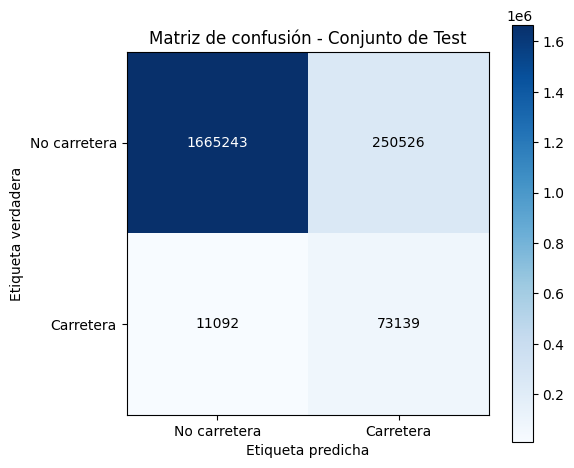

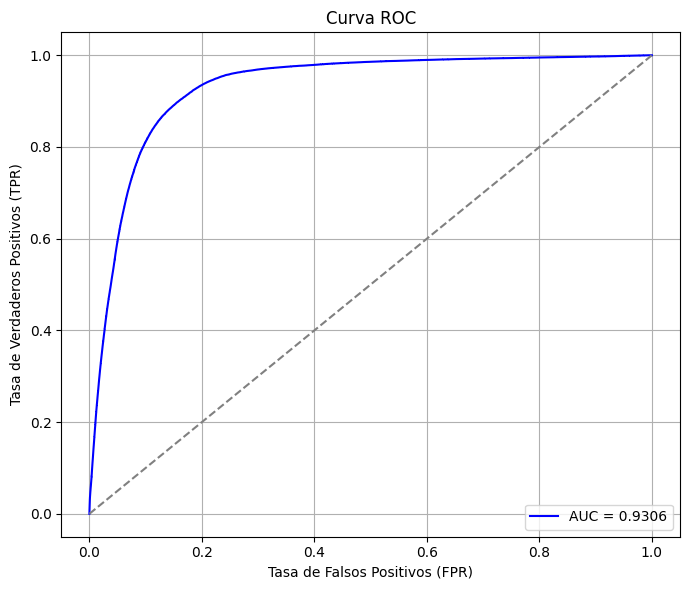

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model

# Predecir probabilidades sobre X_test
y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# Reporte de clasificación
print("Classification Report:")
print(classification_report(y_test, y_pred, digits=4))

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Matriz de confusión - Conjunto de Test")
plt.colorbar()
tick_marks = np.arange(2)
clases = ["No carretera", "Carretera"]
plt.xticks(tick_marks, clases)
plt.yticks(tick_marks, clases)

# Anotar cada celda con su valor
thresh = cm.max() / 2. # Umbral para el color del texto
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.ylabel("Etiqueta verdadera")
plt.xlabel("Etiqueta predicha")
plt.tight_layout()
plt.show()

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
auc = roc_auc_score(y_test, y_pred_probs)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, label=f"AUC = {auc:.4f}", color='blue')
plt.plot([0, 1], [0, 1], linestyle="--", color='gray')
plt.title("Curva ROC")
plt.xlabel("Tasa de Falsos Positivos (FPR)")
plt.ylabel("Tasa de Verdaderos Positivos (TPR)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


Visualizamos las predicciones

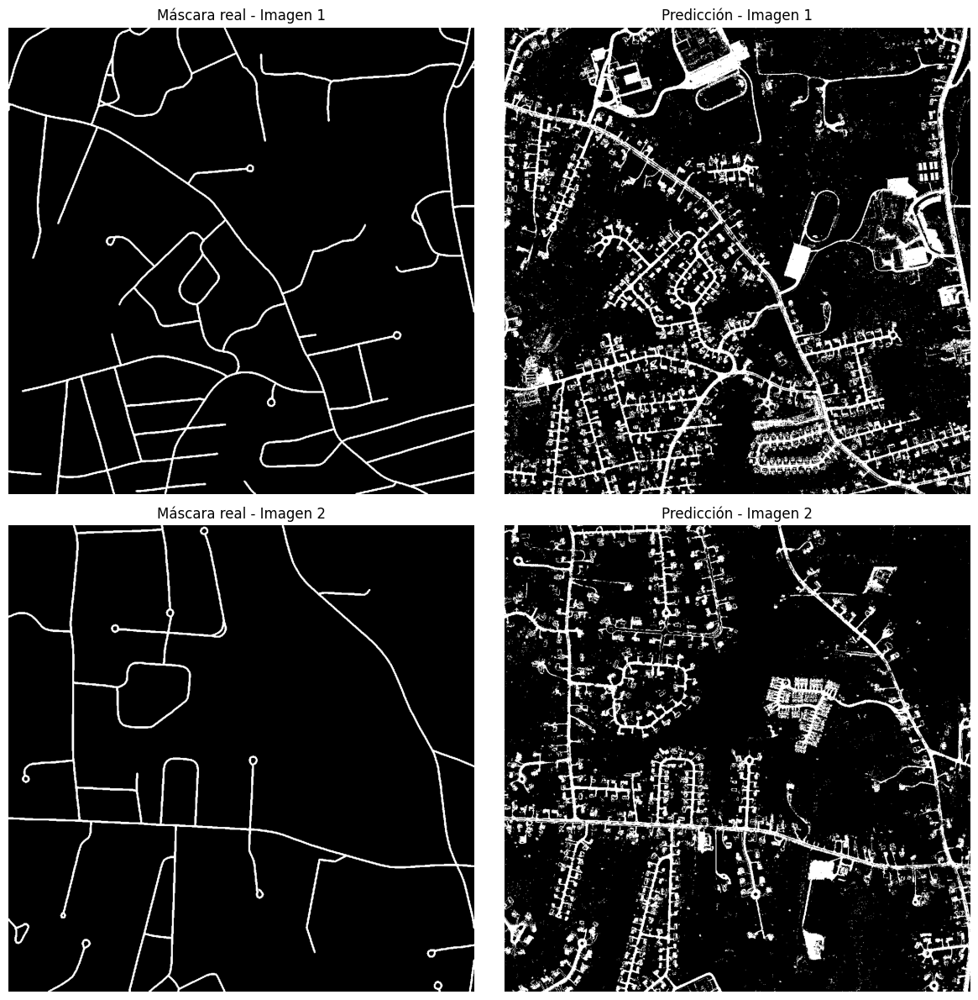

In [67]:
import matplotlib.pyplot as plt

# Dimensiones conocidas
h, w = 1000, 1000

# Separar las predicciones binarias por imagen
preds_img1 = y_pred[:h * w].reshape((h, w))
preds_img2 = y_pred[h * w:2 * h * w].reshape((h, w))

# Separar también las máscaras reales
true_mask1 = y_test[:h * w].reshape((h, w))
true_mask2 = y_test[h * w:2 * h * w].reshape((h, w))

# Mostrar resultados
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

axs[0, 0].imshow(true_mask1, cmap='gray')
axs[0, 0].set_title("Máscara real - Imagen 1")
axs[0, 0].axis('off')

axs[0, 1].imshow(preds_img1, cmap='gray')
axs[0, 1].set_title("Predicción - Imagen 1")
axs[0, 1].axis('off')

axs[1, 0].imshow(true_mask2, cmap='gray')
axs[1, 0].set_title("Máscara real - Imagen 2")
axs[1, 0].axis('off')

axs[1, 1].imshow(preds_img2, cmap='gray')
axs[1, 1].set_title("Predicción - Imagen 2")
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()


Hacemos un post procesado

Aplicamos apertura, ya que con erosion primero reducimos el grosor y alrededores de la carretera, eliminando así ruido y después recuperamos tamaño original con dilatación.

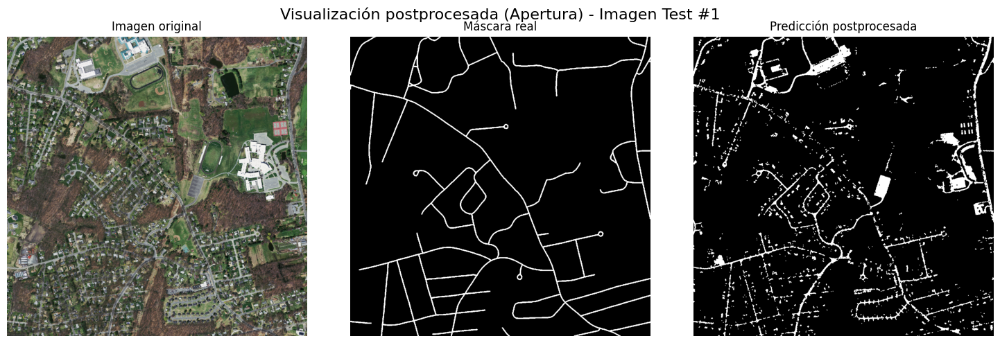

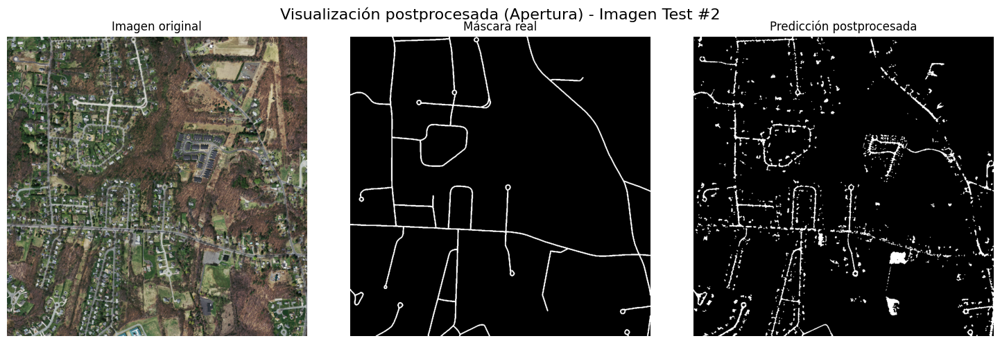

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.morphology import remove_small_objects, erosion, dilation, disk

def postprocesar_apertura2(mask_pred_binaria, min_size=20, erosion_iter=2, selem_radius=1):
    """
    Postprocesado morfológico: apertura compuesta por erosión iterada + dilatación,
    y eliminación de objetos pequeños.
    """
    selem = disk(selem_radius)
    mask_bool = (mask_pred_binaria > 0)

    # Eliminar objetos pequeños
    cleaned = remove_small_objects(mask_bool, min_size=min_size)

    # Erosión iterativa
    eroded = cleaned
    for _ in range(erosion_iter):
        eroded = erosion(eroded, selem)

    # Dilatación única para recuperar conectividad
    dilated = dilation(eroded, selem)

    return dilated.astype(np.uint8)

img_shape = (1000, 1000)  
num_test_images = 2
pixels_per_image = img_shape[0] * img_shape[1]

for i in range(num_test_images):
    start = i * pixels_per_image
    end = (i + 1) * pixels_per_image

    # Reconstruir máscaras
    mask_real = y_test[start:end].reshape(img_shape)
    mask_pred = y_pred[start:end].reshape(img_shape)

    # Postprocesado
    post_mask1 = postprocesar_apertura2(mask_pred, min_size=20, erosion_iter=1, selem_radius=1)

    # Imagen RGB original
    img_rgb = imagenes[18 + i]  

    # Visualización
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Visualización postprocesada (Apertura) - Imagen Test #{i+1}", fontsize=16)

    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_real, cmap='gray')
    plt.title("Máscara real")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(post_mask1, cmap='gray')
    plt.title("Predicción postprocesada")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

Modelo 2: Random Forest, con todas las características

In [20]:
from skimage.transform import resize
import numpy as np

target_size = (1000, 1000)  # (height, width)

imagenes_resized = []
mascaras_resized = []

for img, mask in zip(imagenes, mascaras):
    # Redimensionar imagen con anti-aliasing
    resized_img = resize(img, target_size, preserve_range=True, anti_aliasing=True).astype(np.uint8)

    # Redimensionar máscara sin suavizado ni interpolación continua
    resized_mask = resize(mask, target_size, order=0, preserve_range=True, anti_aliasing=False).astype(np.uint8)

    imagenes_resized.append(resized_img)
    mascaras_resized.append(resized_mask)

# Reemplazo de las listas originales
imagenes = imagenes_resized
mascaras = mascaras_resized


In [42]:
import numpy as np

features_selected_list = []
y_flat_list = []

# Imágenes 0–17 para entrenamiento (18 imágenes)
for img, mask in zip(imagenes[:18], mascaras[:18]):
    feats, _, _ = extract_selected_features(img)
    y_flat = (mask.flatten() > 128).astype(np.uint8)
    features_selected_list.append(feats)
    y_flat_list.append(y_flat)

# Concatenar entrenamiento
X_train_full = np.concatenate(features_selected_list, axis=0)
y_train_full = np.concatenate(y_flat_list, axis=0)

# Test: imágenes 18 y 19
X_test = []
y_test = []

for i in range(18, 20):
    feats, _, _ = extract_selected_features(imagenes[i])
    y_flat = (mascaras[i].flatten() > 128).astype(np.uint8)
    X_test.append(feats)
    y_test.append(y_flat)

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=20,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1,  
)

from sklearn.utils import resample

# Extraer igual número de muestras de cada clase
carretera = X_train_full[y_train_full == 1]
no_carretera = X_train_full[y_train_full == 0]

carretera_y = y_train_full[y_train_full == 1]
no_carretera_y = y_train_full[y_train_full == 0]

# N filas en x_train = longitud de y_train

# Submuestrear negativos (clase mayoritaria)
no_carretera_sample, no_carretera_y_sample = resample(
    no_carretera, no_carretera_y,
    replace=False,
    n_samples=len(carretera),  # igualar número
    random_state=42
)

# Combinar y barajar
X_bal = np.vstack((carretera, no_carretera_sample))
y_bal = np.hstack((carretera_y, no_carretera_y_sample))

# Entrada: X_bal (n_samples, n_features), y_bal (n_samples,)
# Salida: para cada muestra, el modelo predecirá si es carretera (1) o no carretera (0)

# Entrenar
model_rf.fit(X_bal, y_bal)


RandomForestClassifier(class_weight='balanced', max_depth=20, n_jobs=-1,
                       random_state=42)

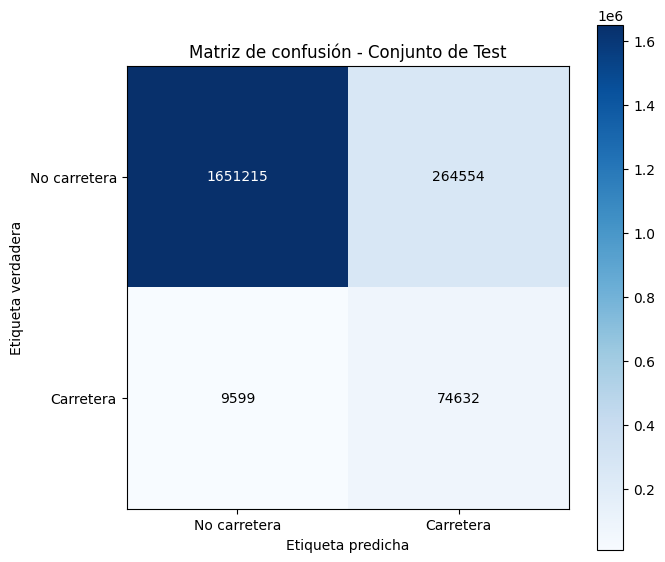

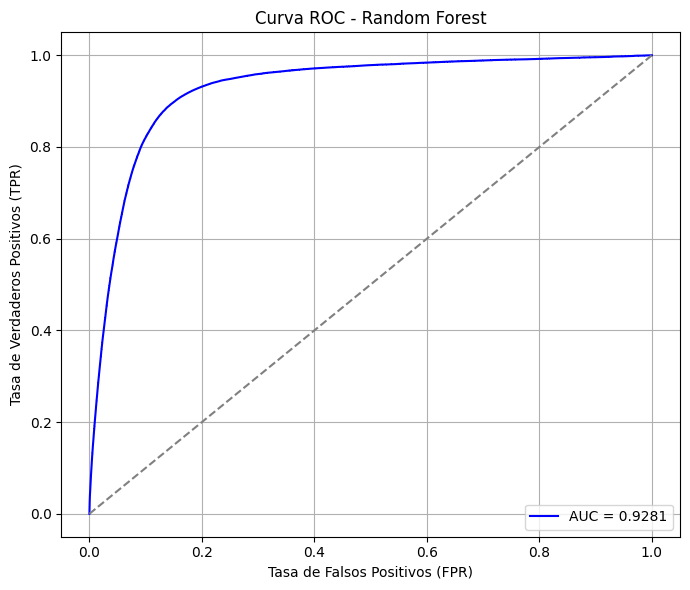

In [ ]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Predicción de probabilidades y etiquetas binarias
y_proba_rf = model_rf.predict_proba(X_test)[:, 1]
y_pred_rf = (y_proba_rf > 0.5).astype(int)

# Matriz de confusión 
cm_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(7, 6))
plt.imshow(cm_rf, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Matriz de confusión - Conjunto de Test")
plt.colorbar()

clases = ["No carretera", "Carretera"]
tick_marks = np.arange(len(clases))
plt.xticks(tick_marks, clases)
plt.yticks(tick_marks, clases)

# Anotar cada celda
thresh = cm_rf.max() / 2
for i in range(cm_rf.shape[0]):
    for j in range(cm_rf.shape[1]):
        plt.text(j, i, format(cm_rf[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm_rf[i, j] > thresh else "black")

plt.ylabel("Etiqueta verdadera")
plt.xlabel("Etiqueta predicha")
plt.tight_layout()
plt.show()

# Curva ROC 
fpr, tpr, _ = roc_curve(y_test, y_proba_rf)
auc_rf = roc_auc_score(y_test, y_proba_rf)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc_rf:.4f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("Curva ROC - Random Forest")
plt.xlabel("Tasa de Falsos Positivos (FPR)")
plt.ylabel("Tasa de Verdaderos Positivos (TPR)")
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()


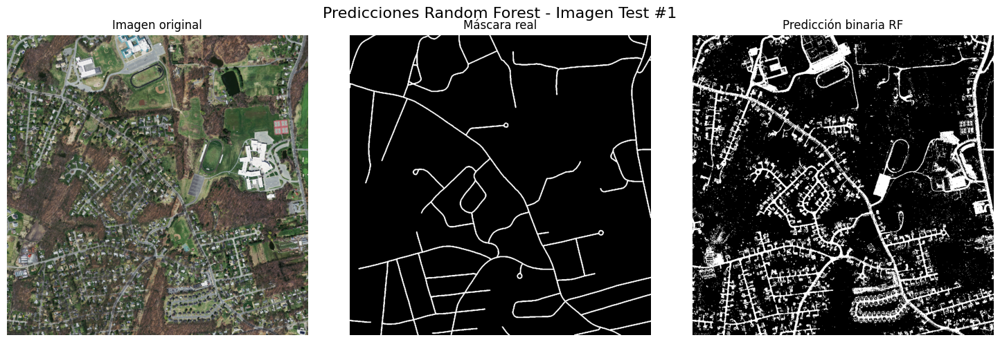

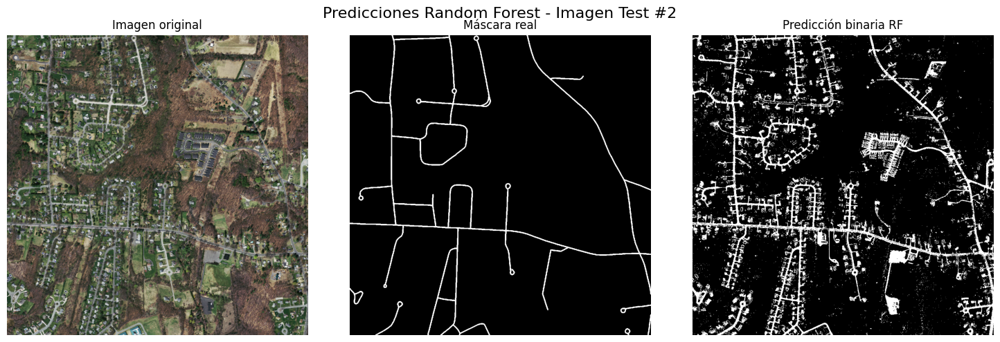

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Parámetros
img_shape = (1000, 1000)
num_test_images = 2
pixels_per_image = img_shape[0] * img_shape[1]

for i in range(num_test_images):
    start = i * pixels_per_image
    end = (i + 1) * pixels_per_image

    # Máscara real y predicción binaria para esta imagen
    mask_real = y_test[start:end].reshape(img_shape)
    pred_bin = y_pred_rf[start:end].reshape(img_shape)

    # Usar imágenes 18 y 19
    img_rgb = imagenes[18 + i]

    # Visualización
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Predicciones Random Forest - Imagen Test #{i+1}", fontsize=16)

    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_real, cmap='gray')
    plt.title("Máscara real")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_bin, cmap='gray')
    plt.title("Predicción binaria RF")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


En este postprocesado solo aplicamos erosión, para ver cómo cambia sin la necesidad de aplicar una dilatación posterior. Saldrán las lineas de las carreteras más finas.

In [ ]:
import numpy as np
from skimage.morphology import remove_small_objects, erosion, disk

def postprocesar_erosion(pred_binaria, radio_kernel=1, min_size=50):
    
    # Binarizar
    mask = (pred_binaria > 0).astype(bool)

    # Eliminar objetos pequeños
    mask = remove_small_objects(mask, min_size=min_size)

    # Crear elemento estructurante
    selem = disk(radio_kernel)

    # Aplicar erosión
    mask_eroded = erosion(mask, selem)

    return mask_eroded.astype(np.uint8)


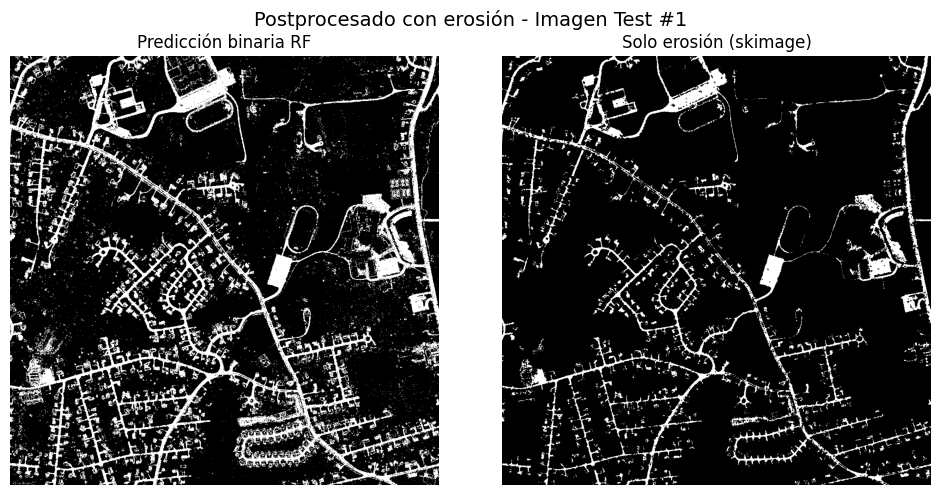

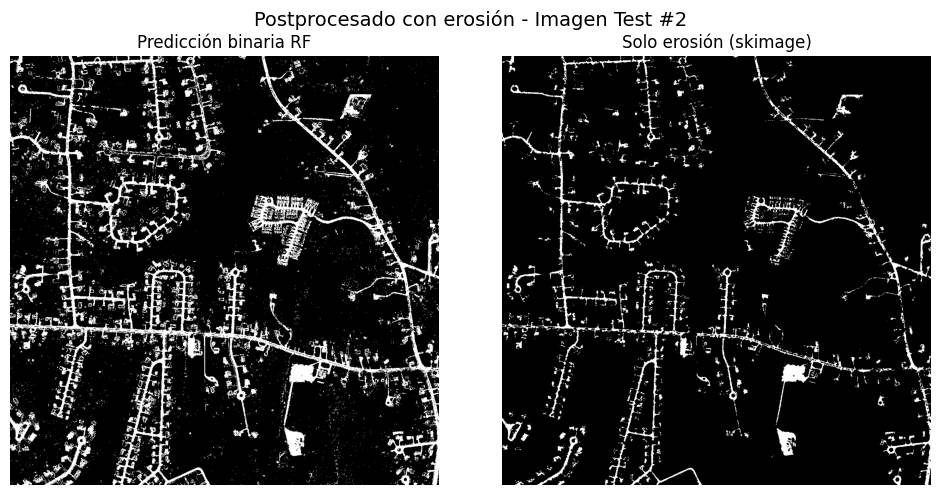

In [ ]:
img_shape = (1000, 1000)
num_test_images = 2
pixels_per_image = img_shape[0] * img_shape[1]

for i in range(num_test_images):
    start = i * pixels_per_image
    end = (i + 1) * pixels_per_image

    # Reconstruir máscara binaria
    pred_binaria = y_pred_rf[start:end].reshape(img_shape)

    # Aplicar solo erosión 
    post_mask2 = postprocesar_erosion(pred_binaria, radio_kernel=1, min_size=50)

    # Visualización
    plt.figure(figsize=(10, 5))
    plt.suptitle(f"Postprocesado con erosión - Imagen Test #{i+1}", fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(pred_binaria, cmap='gray')
    plt.title("Predicción binaria RF")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(post_mask2, cmap='gray')
    plt.title("Solo erosión (skimage)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Ahora quiero probar cogiendo como características solo los canales del modelo RGB

Modelo 3: Random Forest con RGB

In [78]:
import numpy as np

# Entrenamiento: imágenes 0–17 (18 imágenes)
X_train_rgb, y_train_rgb = [], []

for i in range(18):  # imágenes 0 a 17
    rgb_feats = imagenes[i].reshape(-1, 3)
    y_flat = (mascaras[i].flatten() > 128).astype(np.uint8)
    X_train_rgb.append(rgb_feats)
    y_train_rgb.append(y_flat)

X_train_rgb = np.concatenate(X_train_rgb, axis=0)
y_train_rgb = np.concatenate(y_train_rgb, axis=0)

# Test: imágenes 18 y 19 (2 imágenes)
X_test_rgb, y_test_rgb = [], []

for i in range(18, 20):
    rgb_feats = imagenes[i].reshape(-1, 3)
    y_flat = (mascaras[i].flatten() > 128).astype(np.uint8)
    X_test_rgb.append(rgb_feats)
    y_test_rgb.append(y_flat)

X_test_rgb = np.concatenate(X_test_rgb, axis=0)
y_test_rgb = np.concatenate(y_test_rgb, axis=0)


In [ ]:
from sklearn.utils import resample
import numpy as np

# Separar clases
X_carretera_rgb = X_train_rgb[y_train_rgb == 1]
y_carretera_rgb = y_train_rgb[y_train_rgb == 1]

X_no_carretera_rgb = X_train_rgb[y_train_rgb == 0]
y_no_carretera_rgb = y_train_rgb[y_train_rgb == 0]

# Submuestrear negativos para igualar número
X_no_carretera_bal_rgb, y_no_carretera_bal_rgb = resample(
    X_no_carretera_rgb,
    y_no_carretera_rgb,
    replace=False,
    n_samples=len(y_carretera_rgb),
    random_state=42
)

# Combinar clases balanceadas
X_train_bal_rgb = np.vstack((X_carretera_rgb, X_no_carretera_bal_rgb))
y_train_bal_rgb = np.hstack((y_carretera_rgb, y_no_carretera_bal_rgb))

# MEJORA: mezclar aleatoriamente
indices_rgb = np.random.permutation(len(y_train_bal_rgb))
X_train_bal_rgb = X_train_bal_rgb[indices_rgb]
y_train_bal_rgb = y_train_bal_rgb[indices_rgb]


In [51]:
from sklearn.ensemble import RandomForestClassifier

model_rf_rgb = RandomForestClassifier(
    n_estimators=100,
    max_depth=20,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

model_rf_rgb.fit(X_train_bal_rgb, y_train_bal_rgb)


RandomForestClassifier(class_weight='balanced', max_depth=20, n_jobs=-1,
                       random_state=42)

Classification Report - RGB Features:
              precision    recall  f1-score   support

           0     0.9938    0.8607    0.9224   1915769
           1     0.2168    0.8772    0.3477     84231

    accuracy                         0.8614   2000000
   macro avg     0.6053    0.8689    0.6351   2000000
weighted avg     0.9610    0.8614    0.8982   2000000



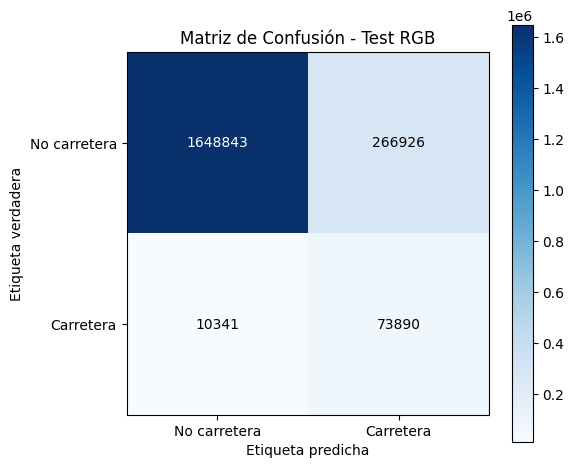

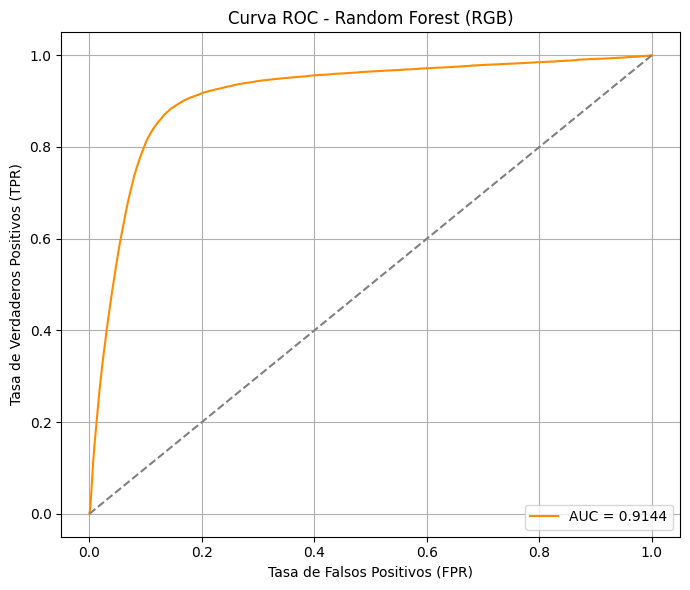

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Obtener las probabilidades de predicción
y_proba_rgb = model_rf_rgb.predict_proba(X_test_rgb)[:, 1]

# Convertir a predicción binaria
y_pred_rgb = (y_proba_rgb > 0.5).astype(int)

# Reporte de clasificación 
print("Classification Report - RGB Features:")
print(classification_report(y_test_rgb, y_pred_rgb, digits=4))

# Matriz de confusión
cm_rgb = confusion_matrix(y_test_rgb, y_pred_rgb)

plt.figure(figsize=(6, 5))
plt.imshow(cm_rgb, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Matriz de Confusión - Test RGB")
plt.colorbar()
tick_marks = np.arange(2)
clases = ["No carretera", "Carretera"]
plt.xticks(tick_marks, clases)
plt.yticks(tick_marks, clases)

# Añadir los valores en las celdas
thresh = cm_rgb.max() / 2
for i in range(cm_rgb.shape[0]):
    for j in range(cm_rgb.shape[1]):
        plt.text(j, i, format(cm_rgb[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm_rgb[i, j] > thresh else "black")

plt.ylabel("Etiqueta verdadera")
plt.xlabel("Etiqueta predicha")
plt.tight_layout()
plt.show()

# Curva ROC 
fpr, tpr, _ = roc_curve(y_test_rgb, y_proba_rgb)
auc = roc_auc_score(y_test_rgb, y_proba_rgb)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, label=f"AUC = {auc:.4f}", color='darkorange')
plt.plot([0, 1], [0, 1], linestyle="--", color='gray')
plt.title("Curva ROC - Random Forest (RGB)")
plt.xlabel("Tasa de Falsos Positivos (FPR)")
plt.ylabel("Tasa de Verdaderos Positivos (TPR)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


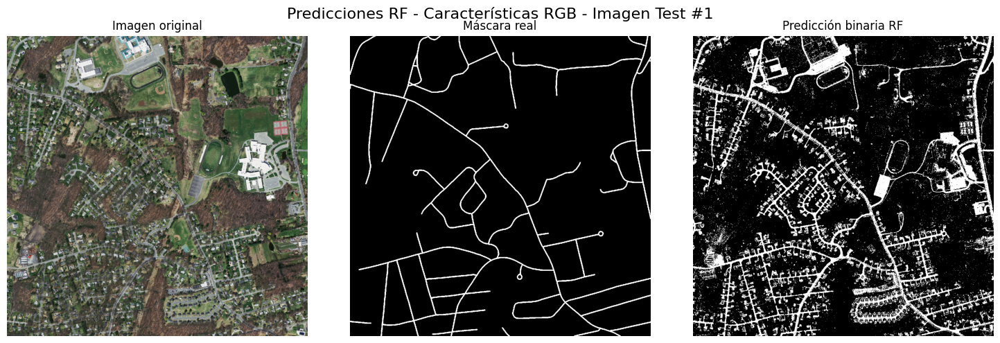

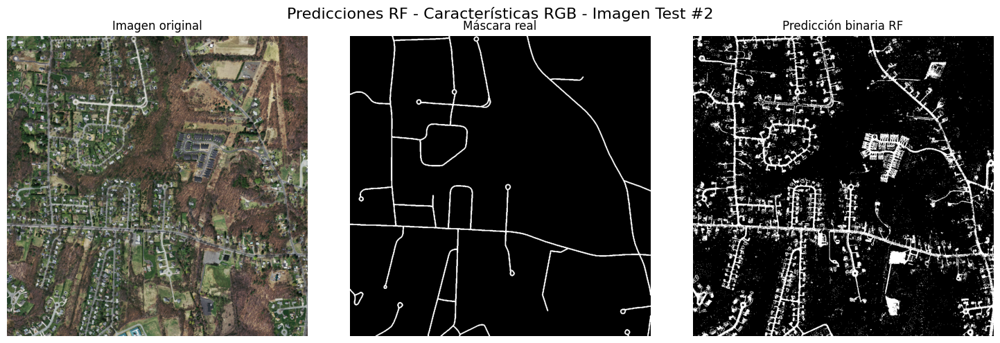

In [ ]:
import matplotlib.pyplot as plt

# Parámetros de la imagen
img_shape = (1000, 1000)
num_test_images = 2
pixels_per_image = img_shape[0] * img_shape[1]

for i in range(num_test_images):
    start = i * pixels_per_image
    end = (i + 1) * pixels_per_image

    # Reconstruir máscaras
    pred_img = y_pred_rgb[start:end].reshape(img_shape)
    mask_real = y_test_rgb[start:end].reshape(img_shape)
    img_rgb = imagenes[18 + i] 

    # Mostrar visualización
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Predicciones RF - Características RGB - Imagen Test #{i+1}", fontsize=16)

    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_real, cmap='gray')
    plt.title("Máscara real")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_img, cmap='gray')
    plt.title("Predicción binaria RF")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Aquí volvemos a aplicar apertura, ya que antes vimos que da mejores resultados que sólo erosión.

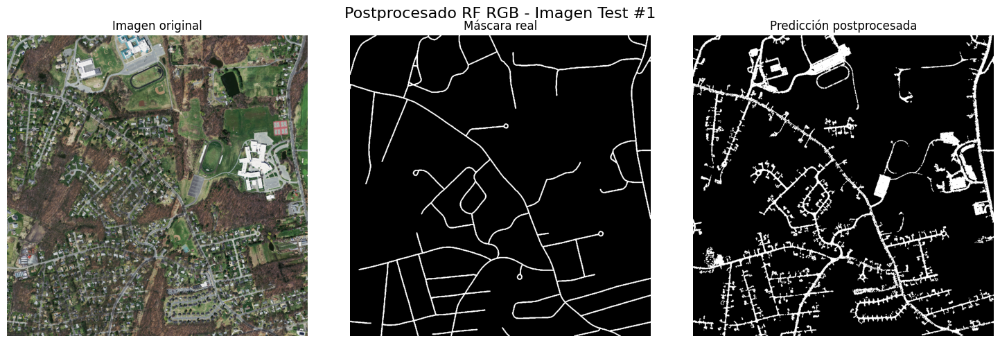

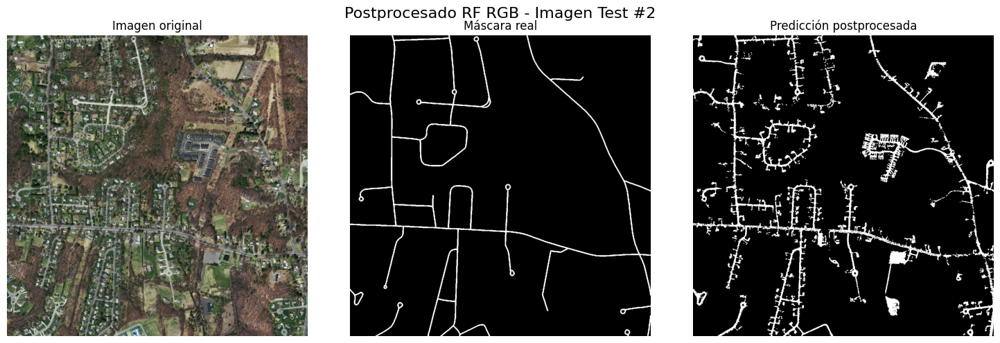

In [ ]:
from skimage.morphology import remove_small_objects, opening, disk
import numpy as np
import matplotlib.pyplot as plt

def postprocesar_apertura2(pred_binaria, min_size=300, radio_kernel=1):
    """
    Aplica limpieza morfológica: eliminación de objetos pequeños y apertura morfológica.
    """
    mask = (pred_binaria > 0).astype(bool)
    mask = remove_small_objects(mask, min_size=min_size)
    selem = disk(radio_kernel)
    mask = opening(mask, selem)
    return mask.astype(np.uint8)

# Parámetros
img_shape = (1000, 1000)
num_test_images = 2
pixels_per_image = img_shape[0] * img_shape[1]

for i in range(num_test_images):
    start = i * pixels_per_image
    end = (i + 1) * pixels_per_image

    # Predicción binaria
    pred_bin = y_pred_rgb[start:end].reshape(img_shape)
    mask_real = y_test_rgb[start:end].reshape(img_shape)
    img_rgb = imagenes[18 + i]  # imágenes de test

    # Postprocesamiento
    post_mask3 = postprocesar_apertura2(pred_bin, min_size=300, radio_kernel=1)

    # Visualización
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Postprocesado RF RGB - Imagen Test #{i+1}", fontsize=16)

    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_real, cmap='gray')
    plt.title("Máscara real")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(post_mask3, cmap='gray')
    plt.title("Predicción postprocesada")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Superposición de los resultados sobre las imágenes satelitales

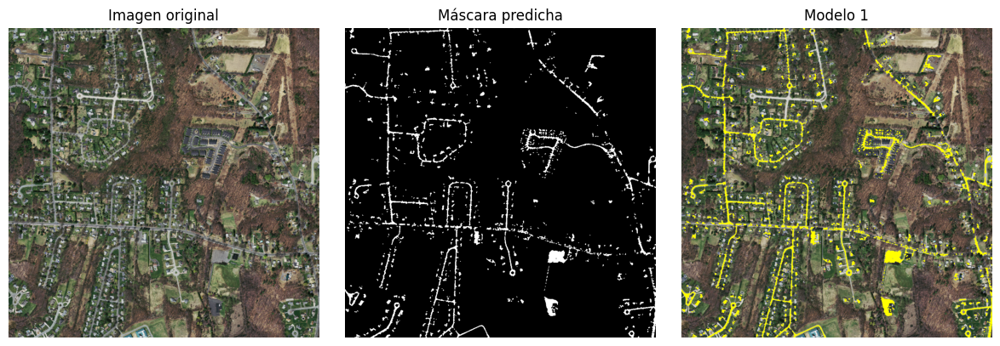

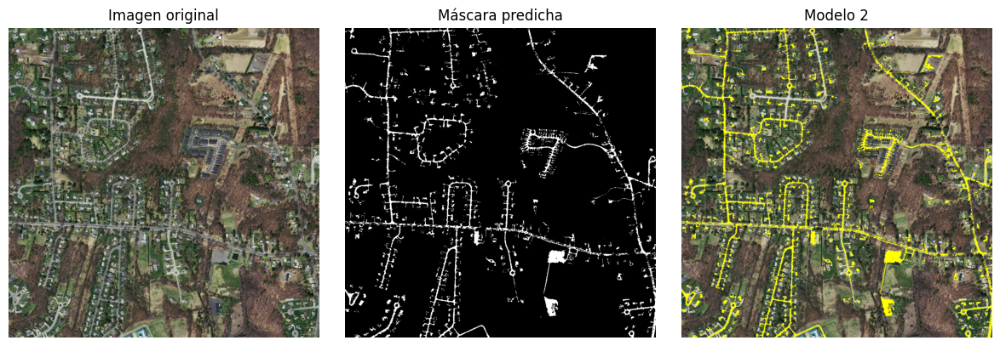

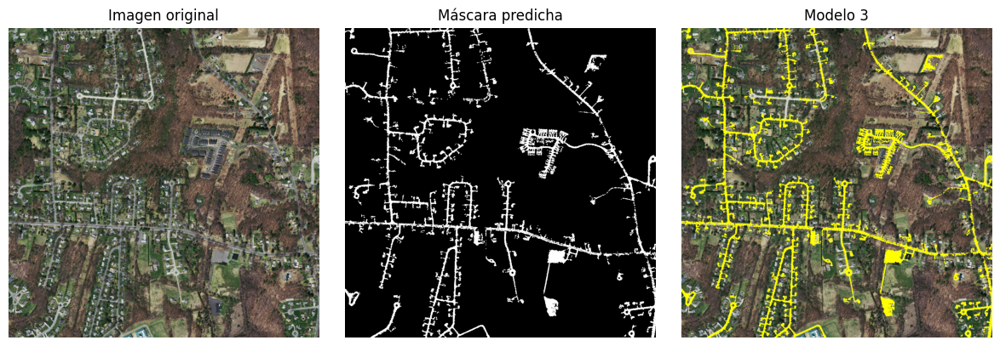

In [76]:
def mostrar_resultados_modelo(img, mask, index_ignorado, title):
    img = img.astype(np.uint8)
    mask = mask.reshape(img.shape[0], img.shape[1])
    
    overlay = img.copy()
    overlay[mask == 1] = [255, 255, 0]

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Máscara predicha")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

mostrar_resultados_modelo(imagenes[19], post_mask1, 0, "Modelo 1")
mostrar_resultados_modelo(imagenes[19], post_mask2, 0, "Modelo 2")
mostrar_resultados_modelo(imagenes[19], post_mask3, 0, "Modelo 3")
